# SentimenTitle

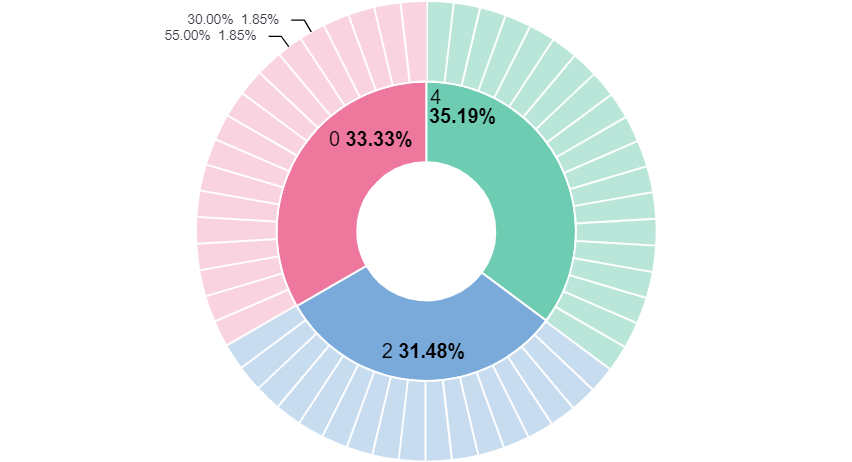

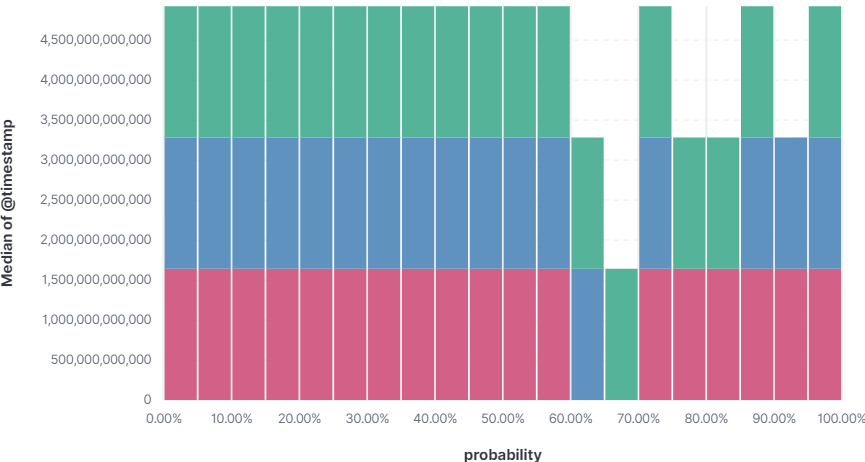

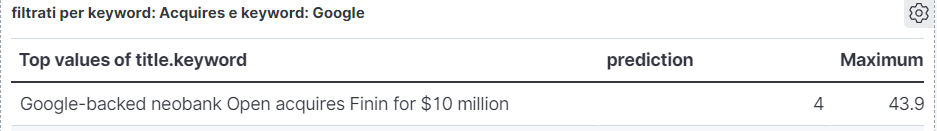

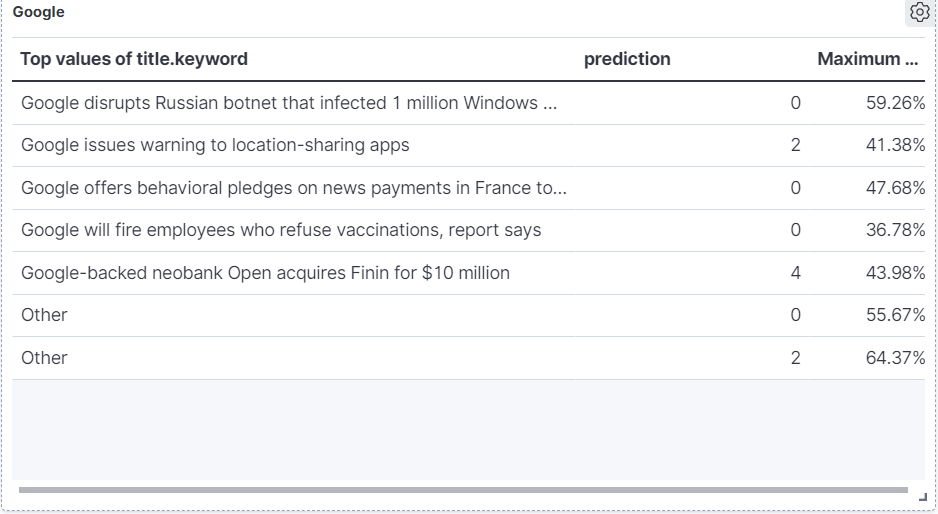

# Spiegazione

SentimenTitle è il progetto sviluppato per il corso di Technologies for Advanced Programming dell'UniCT.
Il progetto presenta una pipeline per la raccolta, elaborazione e visualizzazione dei dati grazie agli strumenti presentati e spiegati durante il corso.
Il progetto consente di raccogliere delle news dal web, tramite lo script "get_news.py" e fare una sentiment analysis sul titolo. Consente dunque di capire se i giornali stanno parlando bene, male o neutrale, di una determinata azienda o persona.
Il progetto è molto semplice, si potrebbe estendere e unire ad esempio a dati azionari in modo da prevedere "Notizie Bomba" che farebbero oscillare il valore azionario. O capire quali giornali sono schierati per una certa causa o meno.
Qui mi limito a mostrare il sentimento verso i titoli e mostrare alcune statistiche come quelle sopra.

# Pipeline

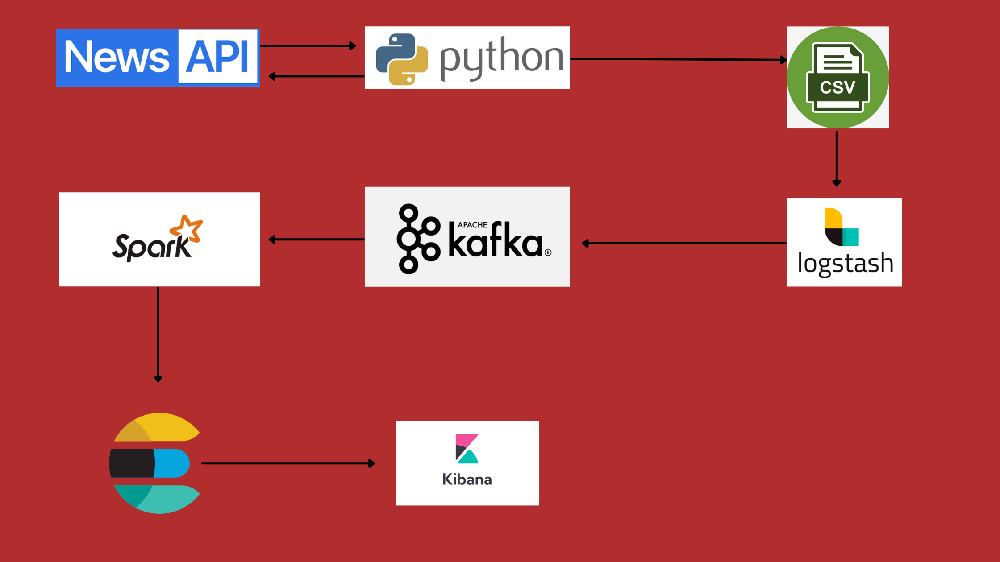

# Datasource 

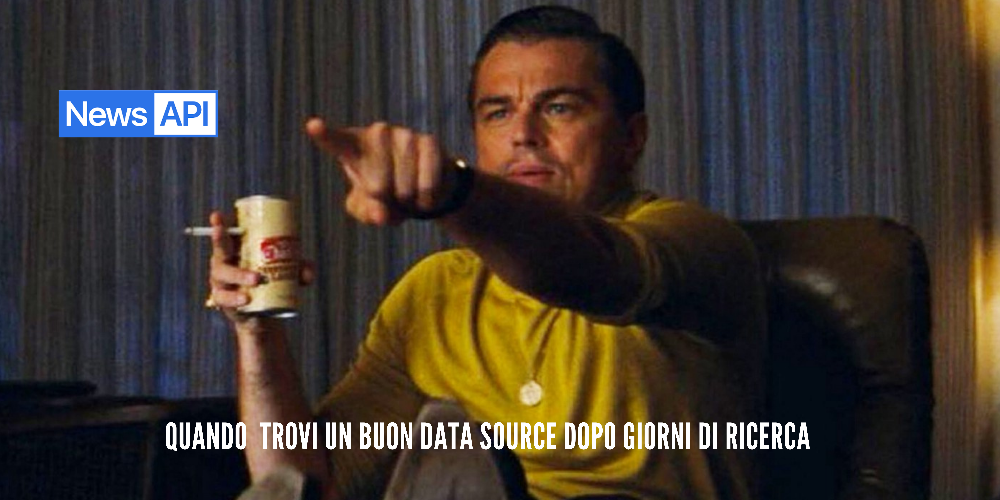

NewsAPI https://newsapi.org/ mi è sembrato molto utile e ben fatto in quanto supporta vari linguaggi ed è ricco di funzionalità. Consente di recuperare in modo gratuito, in formato JSON, gli articoli dell'ultimo mese, riguardo a topic, parole chiave, aziende, in modo veloce e semplice. Tramite il mio script "Get_news" ho sfruttato questa API per ricercare articoli di molteplici aziende anzichè di una per volta, così è anche facilmente manutentibile.
La versione a pagamento consente di averli in tempo reale, in base a parole chiavi o nomi, ma nulla vieta di aggirare tale vincolo semplicemente confrontando il datatime dell'ultimo articolo ottenuto sull'argomento di nostro interesse con il datatime di molteplici richieste al minuto e ottenere notizie più o meno live. Degli articoli ci da tutto: titolo, autore, nome del giornale, data pubblicazione, link dentro l'articolo, URL delle immagini, descrizione. Mi sono limitato all'analisi del titolo, skippando tutte le altre informazioni.


# Training set 

Anche qui ho avuto difficoltà a trovare un dataset di training in quanto quelli che trovavo erano a pagamento ( e siccome non c'ho una lira, figuriamoci i dollari, ho optato per altro). Di conseguenza ho scelto un dataset di tweet perchè ho pensato che molte volte si twittano notizie o commentano news. Ho trovato due dataset, uno di test e l'altro, molto più grande, per il fit, gentilmente offerto da Stanford: http://help.sentiment140.com/for-students



# Data Ingestion: il tool Logstash

Con il termine Data Ingestion si intende il processo con il quale vengono acquisiti e importati i dati per uso immediato o per archiviazione in un database.
Per il progetto si è scelto di utilizzare Logstash per la sua facilità di utilizzo e integrazione con gli altri componenti della pipeline. Infatti lo uso per spedire i titoli a Kafka che poi li passa a Spark per l'analisi.
Inoltre è facile e veloce eseguire dei test in quanto, scrivendo sul csv, si può testare l'arrivo di dati in tempo reale.
A questo punto si potrebbe pensare perchè io non abbia usato dei filtri logstash per pulire i dati che arrivano:
in realtà li ho usati, ma solo quelli che ritenevo necessari. Ho voluto limitare il loro utilizzo. La prima ragione è perchè alcuni filtri non facevano ciò che cercavo, e la seconda è che in versioni future si potrebbero cambiare velocemente i dati che si vogliono semplicemente guardando il codice di "get_news" così da essere facilmente manutentibile anche da altre persone lavorando solo su "get_news". La terza ragione è che ho voluto staccare il codice dagli strumenti che utilizzo così da non essere troppo dipendente sempre per ragioni di manutenzione. Ho usato i filtri "CSV" e "Mutate". Per la descrizione visita rispettivamente https://www.elastic.co/guide/en/logstash/current/plugins-filters-csv.html ed https://www.elastic.co/guide/en/logstash/current/plugins-filters-mutate.html. Dentro mutate utilizzo un remove filed per togliere quei dati che non serviranno mai per il progetto.
Inoltre utilizzo il plugin kafka output, che permette di scrivere gli eventi in un topic kafka.
https://www.elastic.co/guide/en/logstash/current/plugins-outputs-kafka.html

# Data Streaming: il tool Kafka

Qui si è voluto utilizzare Kafka come coda di messaggi per la sua vasta documentazione, facilità d'uso nell'operare sia con logstash che con spark e per fattori di scalabilità futura. Con esso mi limito a pubblicare i dati che gli arrivano da logastash su un topic "news_topic" e tramite spark leggere da questo topic. 

# Problemi con Spark, per gli amici "Corso di parolacce creative"

Nella stesura del codice ho avuto problemi con spark poichè crashava quando cercavo di eseguire il fit. Dopo aver chiesto se qualcuno avesse avuto lo stesso problema e dopo aver cercato online il problema citato, stavo per perdere la speranza. Poi sono andato a leggere tutta la documentazione relativa ai dataframe spark. In pratica prima di fare il fit dovevo trasformare il DF python in DF spark poichè la transform lo richiede, e poi riconvertirlo per spedirlo al data stream che va a caricarlo in Elastic. Dopo aver risolto questo problema avrei dovuto ottenere la cittadinanza Indiana ma sono rimasto umile.

# Il mio adorato Docker

Un ringraziamento a Docker è d'obbligo. Oltre ad evitare problemi di compatibilità, grazie alle sue immagini e al docker-compose ho potuto recuperare tutto in soli 2 minuti dopo che il mio pc si era rotto e portato in assistenza. Grazie a questo imprevisto, ho potuto provare sulla mia pelle la potenza di un tool come questo. E qui viene da dire "e senno questo lavoro come lo fai?" cit.

Un ringraziamento finale lo devo al popolo indiano che sforna video su qualsiasi cosa, che mi ha aiutato a risolvere qualche problemino senza stressare il Professore di domenica mattina, e imparato qualche trick. Stima per questo popolo.